In [1]:
import os

import yaml
from PIL import Image
import torch

from modules import *
from visprog import ProgramRunner

/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [2]:
bgblur = BGBlur()
colorpop = ColorPop()
count = Count()
crop = Crop()
crop_left = CropLeft()
crop_right = CropRight()
crop_above = CropAbove()
crop_below = CropBelow()
emoji = Emoji()
eval_ = Eval()
facedet = FaceDet(device='cpu')
loc = Loc(device='cpu', threshold=0.08)
replace = Replace(device='cuda:0' if torch.cuda.is_available() else 'cpu')
result_ = Result()
seg = Seg(device='cpu')
select = Select(seg.model.config.id2label, seg.model.config.label2id, device='cpu')
vqa = VQA(device='cpu')

/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/diffusers/pipelines/pipeline_utils.py:270: FutureWarning: You are loading the variant fp16 from runwayml/stable-diffusion-inpainting via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn(
text_encoder/model.

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.
/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/transformers/models/maskformer/image_processing_maskformer.py:411: FutureWarning: The `size_divisibility` argument is deprecated and will be removed in v4.27. Please use `size_divisor` instead.
  warnings.warn(
/home/ahmadsa/anaconda3/envs/visprog/lib/python3.11/site-packages/transformers/models/maskformer/

In [3]:
modules = [bgblur, colorpop, count, crop, crop_left, crop_right, crop_above, crop_below, emoji, eval_, facedet, loc, replace, result_, seg, select, vqa]

In [4]:
program_runner = ProgramRunner(modules)

In [5]:
def do_imgedit(image: Image, program: str):
  initial_state = {
    'IMAGE': image,
  }
  steps, result = program_runner.execute_program(program, initial_state)
  return steps, result

In [6]:
with open('assets/fig7/prompts.yaml', 'r') as f:
  prompts = yaml.safe_load(f)

In [7]:
images_dir = 'assets/fig7'

Replace Leonardo DiCaprio with Leonardo DiCaprio wearing sunglasses


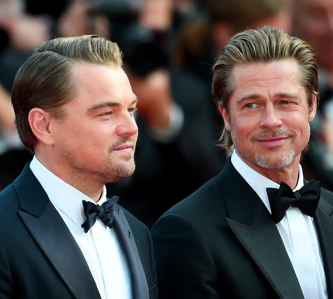

In [8]:
prompt = prompts[0]
instruction = prompt['prompt']['instruction']
image = Image.open(os.path.join(images_dir, prompt['image'])).convert('RGB')
print(instruction)
image.resize((image.size[0] // 4, image.size[1] // 4))

OBJ0 = FACEDET(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Leonardo DiCaprio', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Leonardo DiCaprio wearing sunglasses')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

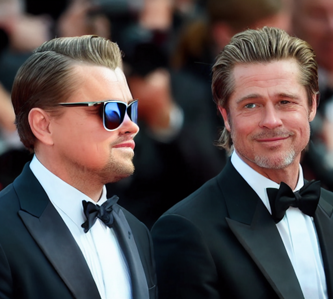

In [9]:
program = prompt['programs'][0]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 4, image.size[1] // 4))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Leonardo DiCaprio', category='person')
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Leonardo DiCaprio wearing sunglasses')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

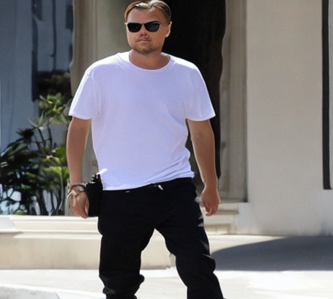

In [10]:
program = prompt['programs'][1]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 4, image.size[1] // 4))

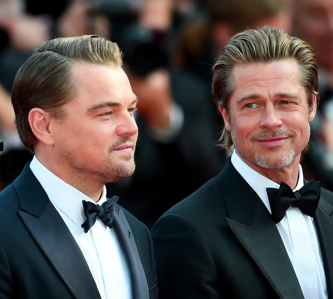

In [11]:
result.step_details[0]['output'][1].resize((image.size[0] // 4, image.size[1] // 4))

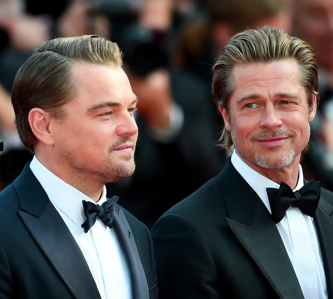

In [12]:
result.step_details[1]['output'].resize((image.size[0] // 4, image.size[1] // 4))

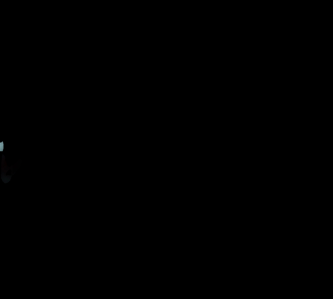

In [13]:
result.step_details[2]['masked_image'].resize((image.size[0] // 4, image.size[1] // 4))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Leonardo DiCaprio', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Leonardo DiCaprio wearing sunglasses')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

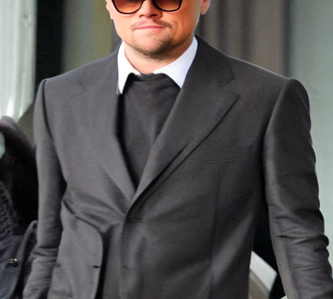

In [14]:
program = prompt['programs'][2]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 4, image.size[1] // 4))

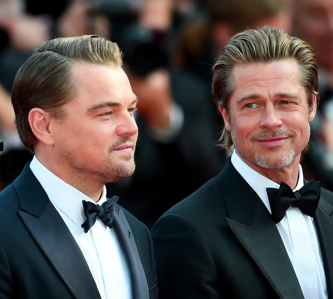

In [15]:
result.step_details[0]['output'][1].resize((image.size[0] // 4, image.size[1] // 4))

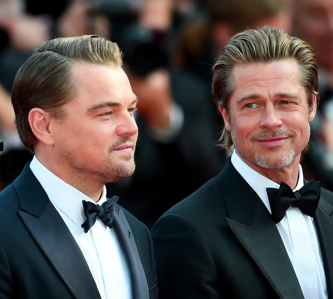

In [16]:
result.step_details[1]['output'].resize((image.size[0] // 4, image.size[1] // 4))

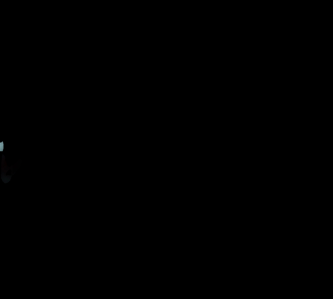

In [17]:
result.step_details[2]['masked_image'].resize((image.size[0] // 4, image.size[1] // 4))

OBJ0 = FACEDET(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Leonardo DiCaprio', category=None)
IMAGE0 = EMOJI(image=IMAGE, object=OBJ1, emoji='smiling_face_with_sunglasses')
FINAL_RESULT = RESULT(var=IMAGE0)



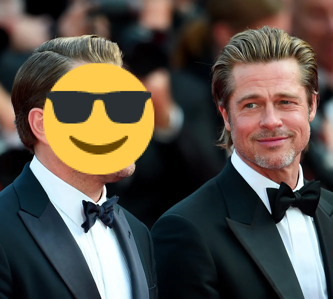

In [18]:
program = prompt['programs'][3]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 4, image.size[1] // 4))

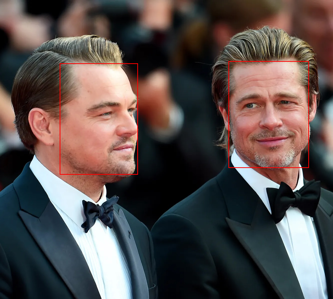

In [19]:
result.step_details[0]['image_with_bbox'].resize((image.size[0] // 4, image.size[1] // 4))

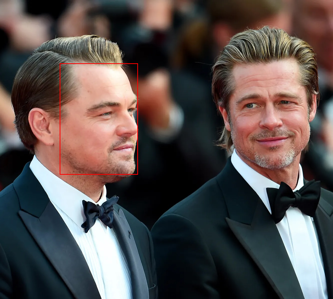

In [20]:
result.step_details[1]['output'].resize((image.size[0] // 4, image.size[1] // 4))

In [21]:
program = prompt['programs'][4]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 4, image.size[1] // 4))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Leonardo DiCaprio', category='person')
OBJ1_WITH_SUNGLASSES = ADD_ACCESSORY(image=IMAGE, object=OBJ1, accessory='sunglasses')
FINAL_RESULT = RESULT(var=OBJ1_WITH_SUNGLASSES)



/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 2: OBJ1_WITH_SUNGLASSES = ADD_ACCESSORY(image=IMAGE, object=OBJ1, accessory='sunglasses'). Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."


KeyError: 'OBJ1_WITH_SUNGLASSES'

Create a colorpop of the woman in blue and the woman in red and blur the background


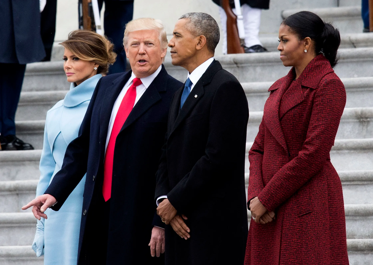

In [22]:
prompt = prompts[1]
instruction = prompt['prompt']['instruction']
image = Image.open(os.path.join(images_dir, prompt['image'])).convert('RGB')
print(instruction)
image.resize((image.size[0] // 6, image.size[1] // 6))

In [23]:
program = prompt['programs'][0]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 6, image.size[1] // 6))

OBJ0=SEG(image=IMAGE)
OBJ1=SELECT(image=IMAGE,object=OBJ0,query='woman in blue, woman in red',category='person')
IMAGE0=COLORPOP(image=IMAGE,object=OBJ1)
IMAGE1=BGBLUR(image=IMAGE0,background=OBJ0)
FINAL_RESULT=RESULT(var=IMAGE1)



/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 3: IMAGE1=BGBLUR(image=IMAGE0,background=OBJ0). Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."


KeyError: 'IMAGE1'

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='woman in blue, woman in red', category=None)
IMAGE0 = COLORPOP(image=IMAGE, object=OBJ1)
IMAGE1 = BGBLUR(image=IMAGE0, object=OBJ1)
FINAL_RESULT = RESULT(var=IMAGE1)



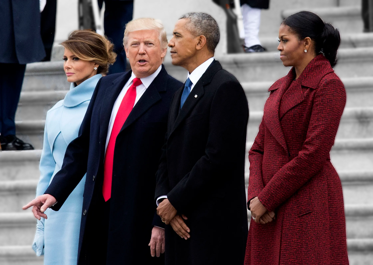

In [24]:
program = prompt['programs'][1]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 6, image.size[1] // 6))

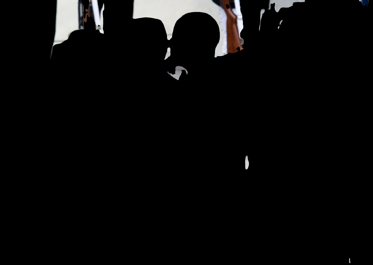

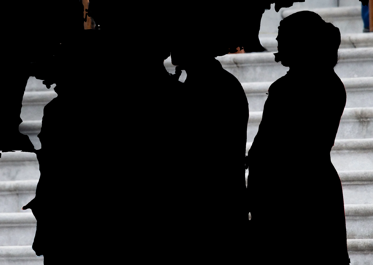

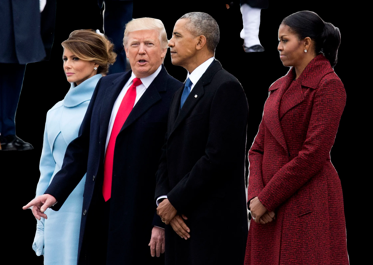

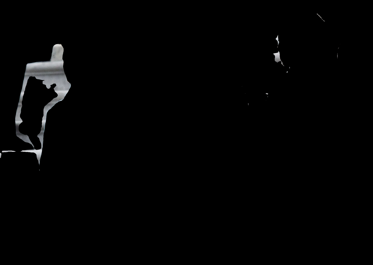

In [25]:
display(*[i.resize((image.size[0] // 6, image.size[1] // 6)) for i in result.step_details[0]['output']])

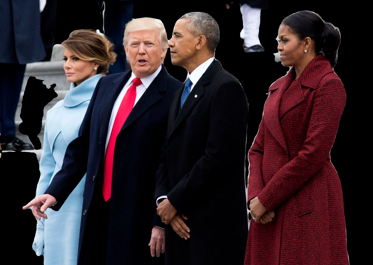

In [26]:
result.step_details[1]['output'].resize((image.size[0] // 6, image.size[1] // 6))

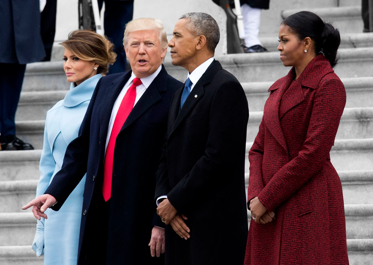

In [27]:
result.step_details[2]['output'].resize((image.size[0] // 6, image.size[1] // 6))

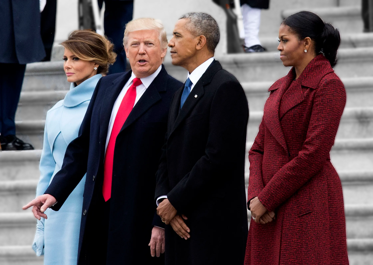

In [28]:
result.step_details[3]['output'].resize((image.size[0] // 6, image.size[1] // 6))

In [29]:
program = prompt['programs'][2]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 6, image.size[1] // 6))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='woman in blue', category='person')
OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='woman in red', category='person')
IMAGE0 = COLORPOP(image=IMAGE, object=OBJ1)
IMAGE1 = COLORPOP(image=IMAGE, object=OBJ2)
COMBINED_IMAGE = COMBINE_IMAGES(images=[IMAGE0, IMAGE1])
FINAL_RESULT = BGBLUR(image=COMBINED_IMAGE, object=None)



/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 5: COMBINED_IMAGE = COMBINE_IMAGES(images=[IMAGE0, IMAGE1]). Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."


KeyError: 'COMBINED_IMAGE'

In [30]:
program = prompt['programs'][3]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 6, image.size[1] // 6))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='woman in blue', category=None)
OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='woman in red', category=None)
IMAGE0 = COLORPOP(image=IMAGE, object=[OBJ1, OBJ2])
IMAGE1 = BLUR(image=IMAGE0, object=OBJ0)
FINAL_RESULT = RESULT(var=IMAGE1)



/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 3: IMAGE0 = COLORPOP(image=IMAGE, object=[OBJ1, OBJ2]). Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."
/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 4: IMAGE1 = BLUR(image=IMAGE0, object=OBJ0). Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."


KeyError: 'IMAGE1'

In [31]:
program = prompt['programs'][4]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 6, image.size[1] // 6))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='woman in blue', category=None)
OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='woman in red', category=None)
IMAGE0 = COLORPOP(image=IMAGE, object=[OBJ1, OBJ2])
IMAGE1 = BLUR(image=IMAGE0, object=BACKGROUND)
FINAL_RESULT = RESULT(var=IMAGE1)



/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 4: IMAGE1 = BLUR(image=IMAGE0, object=BACKGROUND). Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."


KeyError: 'IMAGE1'

Replace Anne Hathaway with Emma Watson and Meryl Streep with Jennifer Lawrence


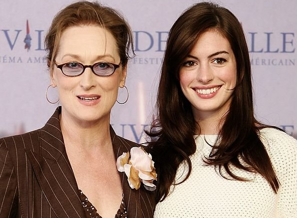

In [32]:
prompt = prompts[2]
instruction = prompt['prompt']['instruction']
image = Image.open(os.path.join(images_dir, prompt['image'])).convert('RGB')
print(instruction)
image.resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway', category=None)
OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='Meryl Streep', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')
IMAGE1 = REPLACE(image=IMAGE0, object=OBJ2, prompt='Jennifer Lawrence')
FINAL_RESULT = RESULT(var=IMAGE1)



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

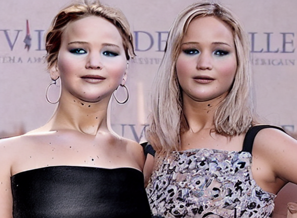

In [33]:
program = prompt['programs'][0]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

'OBJ0 = SEG(image=IMAGE)'

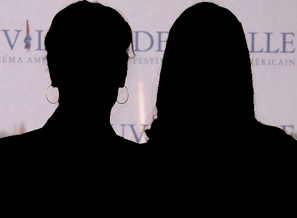

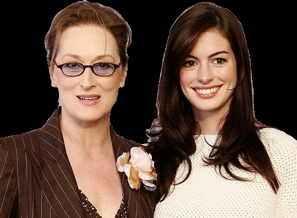

In [34]:
display(steps[0], *[i.resize((image.size[0] // 2, image.size[1] // 2)) for i in result.step_details[0]['output']])

OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway', category=None)


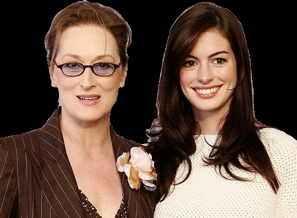

In [35]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ2 = SELECT(image=IMAGE, object=OBJ0, query='Meryl Streep', category=None)


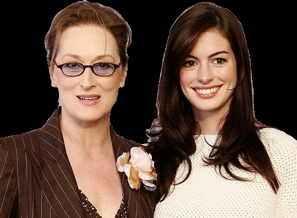

In [36]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')


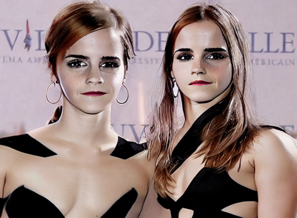

In [37]:
print(steps[3])
result.step_details[3]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE1 = REPLACE(image=IMAGE0, object=OBJ2, prompt='Jennifer Lawrence')


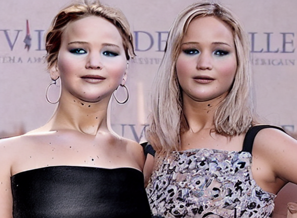

In [38]:
print(steps[4])
result.step_details[4]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ_ANNE = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway', category='person')
OBJ_MERYL = SELECT(image=IMAGE, object=OBJ0, query='Meryl Streep', category='person')
IMAGE_ANNE_REPLACED = REPLACE(image=IMAGE, object=OBJ_ANNE, prompt='Emma Watson')
IMAGE_FINAL = REPLACE(image=IMAGE_ANNE_REPLACED, object=OBJ_MERYL, prompt='Jennifer Lawrence')
FINAL_RESULT = RESULT(var=IMAGE_FINAL)



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

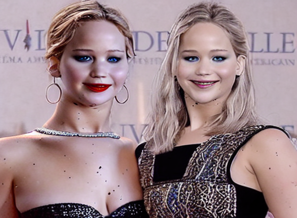

In [41]:
program = prompt['programs'][1]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE_ANNE_REPLACED = REPLACE(image=IMAGE, object=OBJ_ANNE, prompt='Emma Watson')


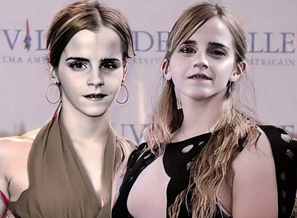

In [42]:
print(steps[3])
result.step_details[3]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway,Meryl Streep', category='person')
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')
IMAGE1 = REPLACE(image=IMAGE0, object=OBJ1, prompt='Jennifer Lawrence')
FINAL_RESULT = RESULT(var=IMAGE1)



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

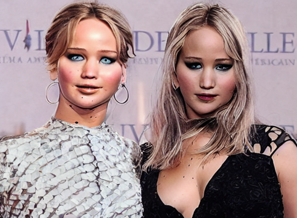

In [44]:
program = prompt['programs'][2]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson')


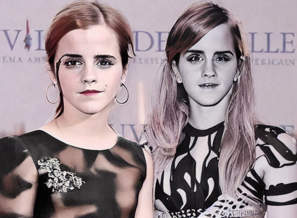

In [45]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = FACEDET(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway, Meryl Streep', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='Emma Watson, Jennifer Lawrence')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

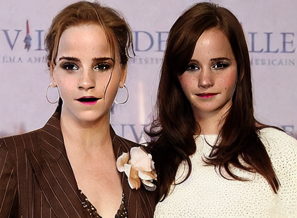

In [46]:
program = prompt['programs'][3]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = FACEDET(image=IMAGE)


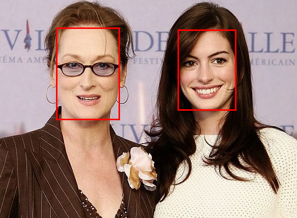

In [47]:
print(steps[0])
result.step_details[0]['image_with_bbox'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway, Meryl Streep', category=None)


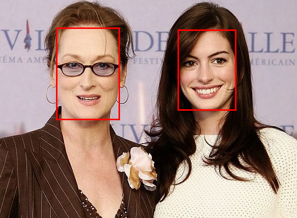

In [48]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = FACEDET(image=IMAGE)
ANNE_HATHAWAY = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway', category=None)
MERYL_STREEP = SELECT(image=IMAGE, object=OBJ0, query='Meryl Streep', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=ANNE_HATHAWAY, prompt='Emma Watson')
IMAGE1 = REPLACE(image=IMAGE0, object=MERYL_STREEP, prompt='Jennifer Lawrence')
FINAL_RESULT = RESULT(var=IMAGE1)



  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

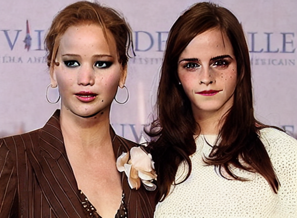

In [49]:
program = prompt['programs'][4]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = FACEDET(image=IMAGE)


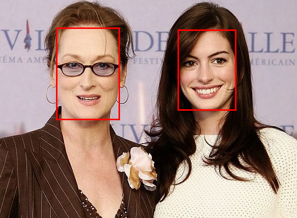

In [50]:
print(steps[0])
result.step_details[0]['image_with_bbox'].resize((image.size[0] // 2, image.size[1] // 2))

ANNE_HATHAWAY = SELECT(image=IMAGE, object=OBJ0, query='Anne Hathaway', category=None)


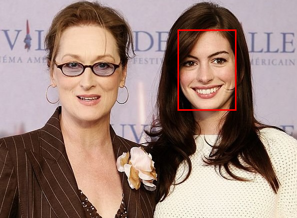

In [51]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

MERYL_STREEP = SELECT(image=IMAGE, object=OBJ0, query='Meryl Streep', category=None)


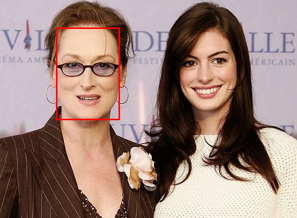

In [52]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=ANNE_HATHAWAY, prompt='Emma Watson')


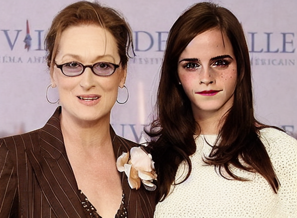

In [53]:
print(steps[3])
result.step_details[3]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE1 = REPLACE(image=IMAGE0, object=MERYL_STREEP, prompt='Jennifer Lawrence')


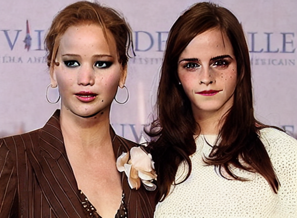

In [54]:
print(steps[4])
result.step_details[4]['output'].resize((image.size[0] // 2, image.size[1] // 2))

Replace the desert by sandy beach


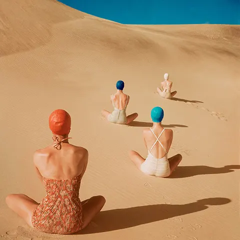

In [55]:
prompt = prompts[3]
instruction = prompt['prompt']['instruction']
image = Image.open(os.path.join(images_dir, prompt['image'])).convert('RGB')
print(instruction)
image.resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

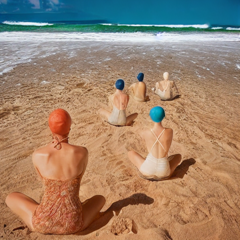

In [56]:
program = prompt['programs'][0]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

'OBJ0 = SEG(image=IMAGE)'

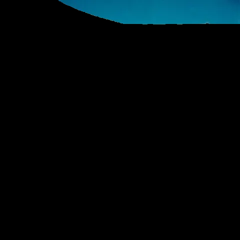

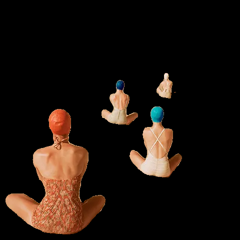

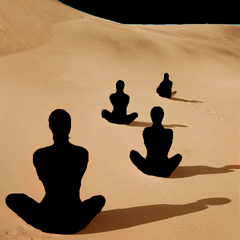

In [57]:
display(steps[0], *[i.resize((image.size[0] // 2, image.size[1] // 2)) for i in result.step_details[0]['output']])

OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)


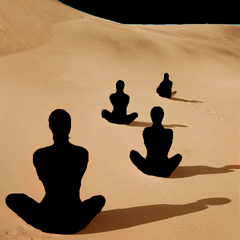

In [58]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')


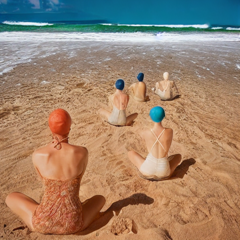

In [59]:
print(steps[2])
result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0=SEG(image=IMAGE)
OBJ1=SELECT(image=IMAGE,object=OBJ0,query='desert',category=None)
IMAGE0=REPLACE(image=IMAGE,object=OBJ1,prompt='sandy beach')
FINAL_RESULT=RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

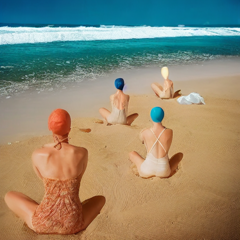

In [60]:
program = prompt['programs'][1]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

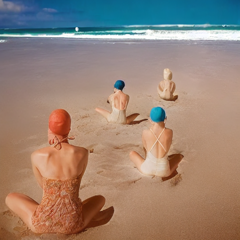

In [61]:
program = prompt['programs'][2]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

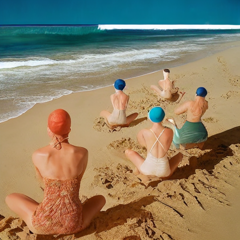

In [62]:
program = prompt['programs'][3]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='desert', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='sandy beach')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

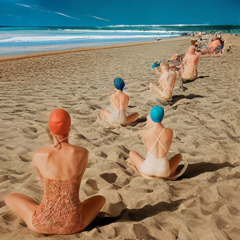

In [63]:
program = prompt['programs'][4]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

Replace the couch with a plush blue couch


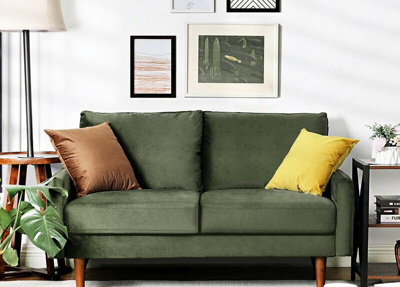

In [64]:
prompt = prompts[4]
instruction = prompt['prompt']['instruction']
image = Image.open(os.path.join(images_dir, prompt['image'])).convert('RGB')
print(instruction)
image.resize((image.size[0] // 2, image.size[1] // 2))

In [65]:
program = prompt['programs'][0]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, replacement='plush_blue_couch.png')
FINAL_RESULT = RESULT(var=IMAGE0)



/home/ahmadsa/EECS6322-reproducibility-challenge/visprog/program_runner.py:41: UserWarning: No module matched step 2: IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, replacement='plush_blue_couch.png'). Skipping. This may be a bug in the program generation.
  warnings.warn(f"No module matched step {i}: {step}. Skipping."


KeyError: 'IMAGE0'

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='plush blue couch')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

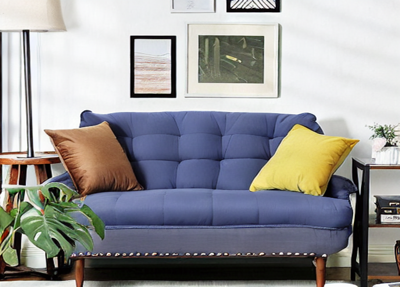

In [66]:
program = prompt['programs'][1]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

'OBJ0 = SEG(image=IMAGE)'

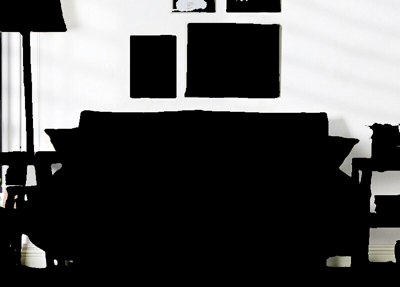

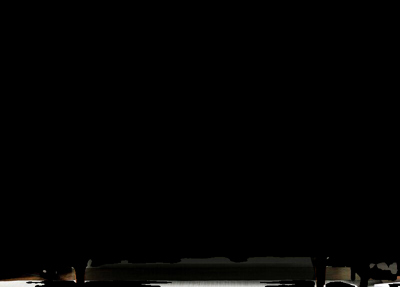

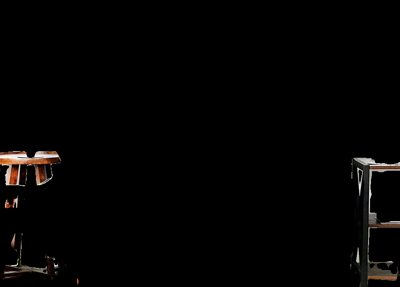

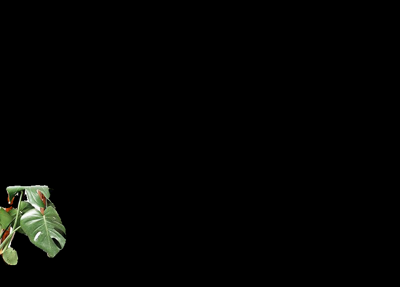

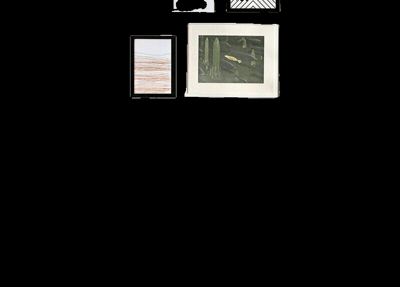

...

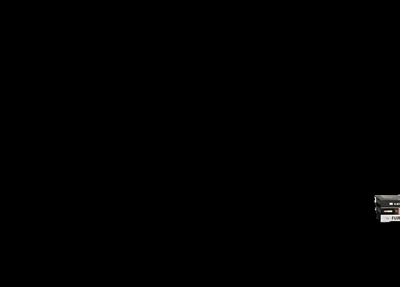

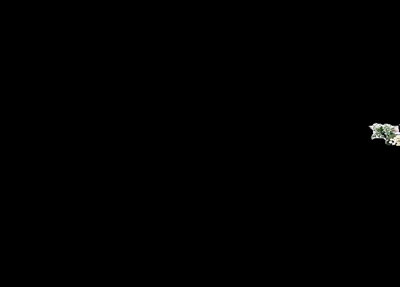

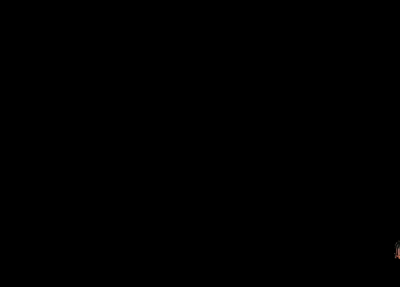

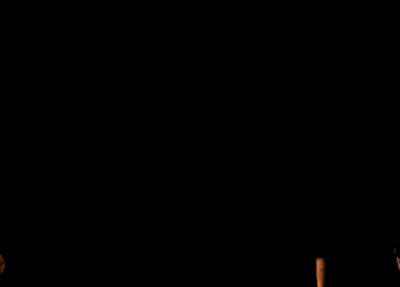

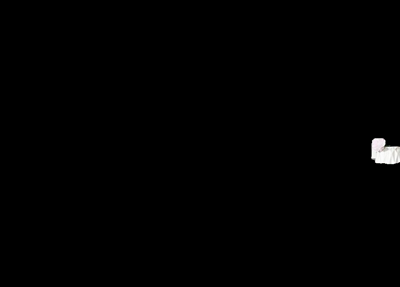

In [67]:
display(steps[0], *[i.resize((image.size[0] // 2, image.size[1] // 2)) for i in result.step_details[0]['output']])

OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category=None)


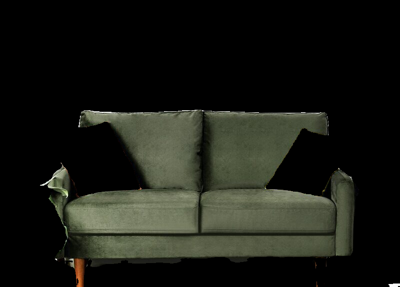

In [68]:
print(steps[1])
result.step_details[1]['output'].resize((image.size[0] // 2, image.size[1] // 2))

IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='plush blue couch')


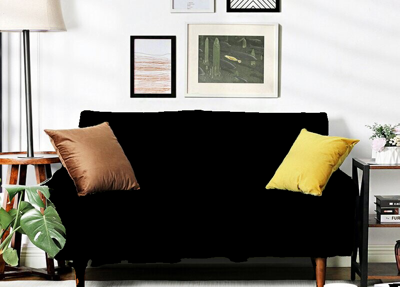

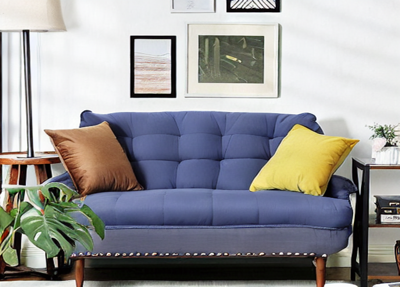

In [71]:
print(steps[2])
display(result.step_details[2]['masked_image'].resize((image.size[0] // 2, image.size[1] // 2)),
        result.step_details[2]['output'].resize((image.size[0] // 2, image.size[1] // 2)))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category='furniture')
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='plush blue couch')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

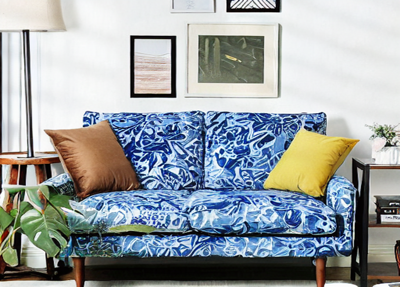

In [72]:
program = prompt['programs'][2]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='plush blue couch')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

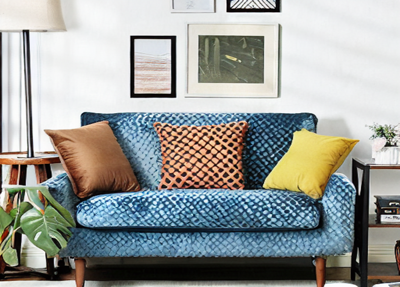

In [73]:
program = prompt['programs'][3]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))

OBJ0 = SEG(image=IMAGE)
OBJ1 = SELECT(image=IMAGE, object=OBJ0, query='couch', category=None)
IMAGE0 = REPLACE(image=IMAGE, object=OBJ1, prompt='plush blue couch')
FINAL_RESULT = RESULT(var=IMAGE0)



  0%|          | 0/50 [00:00<?, ?it/s]

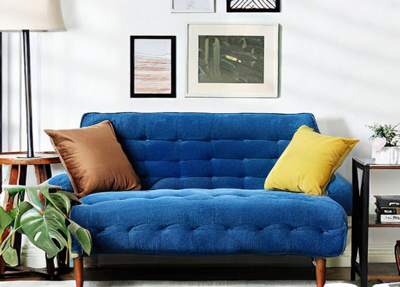

In [74]:
program = prompt['programs'][4]
print(program)
steps, result = do_imgedit(image, program)
result.output['var'].resize((image.size[0] // 2, image.size[1] // 2))